<a href="https://colab.research.google.com/github/anubhavgupta1/Udacity/blob/main/Frameworks/Pytorch/GANs/Coursera/Basic/Detailed/MNIST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

In [2]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### `MNIST Dataset`
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### `Tensor`
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### `Batches`
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## `Generator`
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [3]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [4]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

In [5]:
print(test_gen_block(25, 12))
print(test_gen_block(15, 28))
print("Success!")

None
None
Success!


In [6]:
block = get_generator_block(20,40)
print("Generator Block With Input Features : 20 and Output Features : 40   \n\n{}".format(block))

Generator Block With Input Features : 20 and Output Features : 40   

Sequential(
  (0): Linear(in_features=20, out_features=40, bias=True)
  (1): BatchNorm1d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
)


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [7]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [8]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

In [9]:
print(test_generator(5, 10, 20))
print(test_generator(20, 8, 24))
print("Success!")

None
None
Success!


In [10]:
generator_model = Generator(5, 10, 20).get_gen()
print(generator_model)

Sequential(
  (0): Sequential(
    (0): Linear(in_features=5, out_features=20, bias=True)
    (1): BatchNorm1d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (1): Sequential(
    (0): Linear(in_features=20, out_features=40, bias=True)
    (1): BatchNorm1d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (2): Sequential(
    (0): Linear(in_features=40, out_features=80, bias=True)
    (1): BatchNorm1d(80, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (3): Sequential(
    (0): Linear(in_features=80, out_features=160, bias=True)
    (1): BatchNorm1d(160, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (4): Linear(in_features=160, out_features=10, bias=True)
  (5): Sigmoid()
)


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [11]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples,z_dim,device=device)
    #### END CODE HERE ####

In [12]:
noise = get_noise(2, 3, 'cpu')
print("Noise shpae is : {} x {}".format(noise.shape[0],noise.shape[1]))

Noise shpae is : 2 x 3


In [13]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

In [14]:
test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](relu-graph.png)  |  ![](lrelu-graph.png)





In [15]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
         nn.Linear(input_dim, output_dim), #Layer 1
         nn.LeakyReLU(0.2, inplace=True)
        #### END CODE HERE ####
    )

In [16]:
block = get_discriminator_block(20,40)
print("Discriminator Block With Input Features : 20 and Output Features : 40   \n\n{}".format(block))

Discriminator Block With Input Features : 20 and Output Features : 40   

Sequential(
  (0): Linear(in_features=20, out_features=40, bias=True)
  (1): LeakyReLU(negative_slope=0.2, inplace=True)
)


In [17]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5
    
    assert str(block.__getitem__(0)).replace(' ', '') == f'Linear(in_features={in_features},out_features={out_features},bias=True)'        
    assert str(block.__getitem__(1)).replace(' ', '').replace(',inplace=True', '') == 'LeakyReLU(negative_slope=0.2)'

In [18]:
test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [19]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [20]:
discriminator_model = Discriminator(5, 10).get_disc()
print(discriminator_model)

Sequential(
  (0): Sequential(
    (0): Linear(in_features=5, out_features=40, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (1): Sequential(
    (0): Linear(in_features=40, out_features=20, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (2): Sequential(
    (0): Linear(in_features=20, out_features=10, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (3): Linear(in_features=10, out_features=1, bias=True)
)


In [21]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

In [22]:
test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [23]:
# Load MNIST dataset as tensors
batch_size = 128
dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()),batch_size=batch_size,shuffle=True)

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw




Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw
Processing...
Done!


/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:480: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [24]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
display_step = 500
lr = 0.00001
device = 'cuda'

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [25]:
z_dim = 64
generator_model = Generator(z_dim).to(device)
print("Final Generator Model is : \n\n{}".format(generator_model.get_gen()))

Final Generator Model is : 

Sequential(
  (0): Sequential(
    (0): Linear(in_features=64, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (1): Sequential(
    (0): Linear(in_features=128, out_features=256, bias=True)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (2): Sequential(
    (0): Linear(in_features=256, out_features=512, bias=True)
    (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (3): Sequential(
    (0): Linear(in_features=512, out_features=1024, bias=True)
    (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (4): Linear(in_features=1024, out_features=784, bias=True)
  (5): Sigmoid()
)


In [26]:
gen_opt = torch.optim.Adam(generator_model.parameters(), lr=lr)

In [27]:
discriminator_model = Discriminator().to(device) 
print("Final Discriminator Model is : \n\n{}".format(discriminator_model))

Final Discriminator Model is : 

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=128, bias=True)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Linear(in_features=128, out_features=1, bias=True)
  )
)


In [28]:
disc_opt = torch.optim.Adam(discriminator_model.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [29]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [30]:
def test_disc_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

In [31]:
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

In [32]:
test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [33]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [34]:
def test_gen_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

In [35]:
def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))

In [36]:
print(test_gen_reasonable(10))
print(test_gen_reasonable(18))
print("Success!")

None
None
Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:

Step 500: Generator loss: 1.319024210810661, discriminator loss: 0.42763868063688226


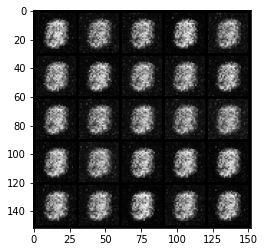

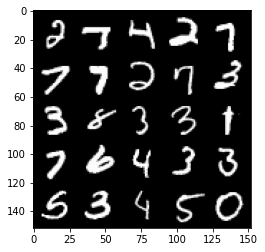

Step 1000: Generator loss: 1.6541071629524229, discriminator loss: 0.2961980735659601


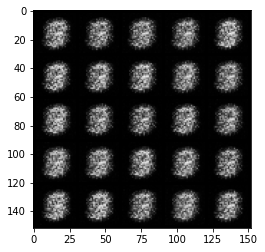

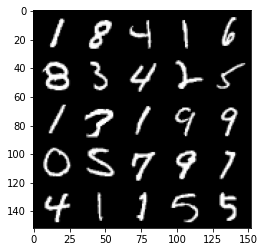

Step 1500: Generator loss: 1.8734849548339834, discriminator loss: 0.18695003265142457


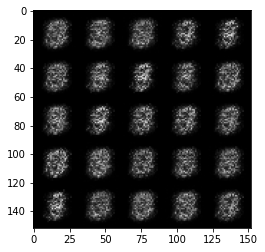

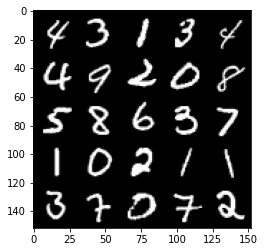

Step 2000: Generator loss: 1.6180025947093977, discriminator loss: 0.23104258087277396


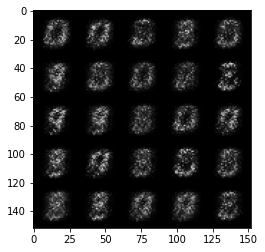

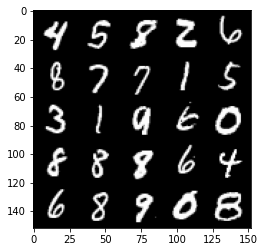

Step 2500: Generator loss: 1.593101961612703, discriminator loss: 0.22467558142542848


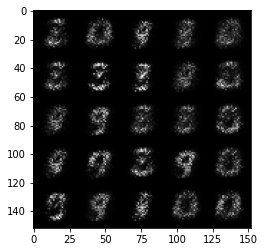

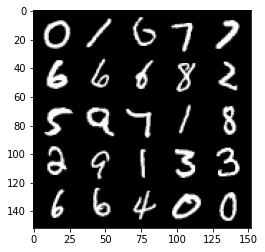

Step 3000: Generator loss: 1.8586860842704773, discriminator loss: 0.18746008121967309


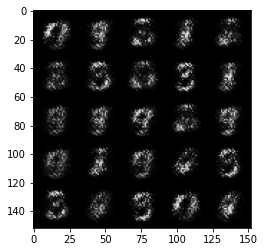

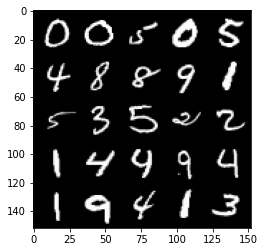

Step 3500: Generator loss: 2.3011279656887074, discriminator loss: 0.13047086901962757


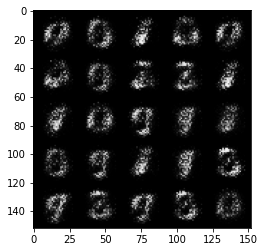

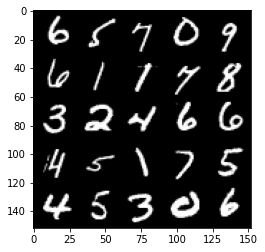

Step 4000: Generator loss: 2.7971982321739195, discriminator loss: 0.09499387235939502


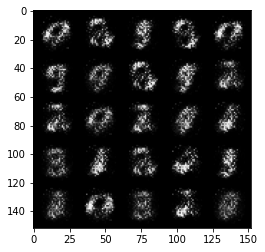

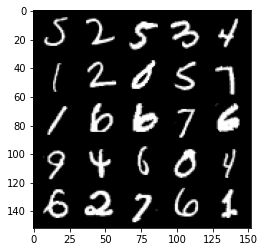

Step 4500: Generator loss: 3.219744616985318, discriminator loss: 0.08025055491179216


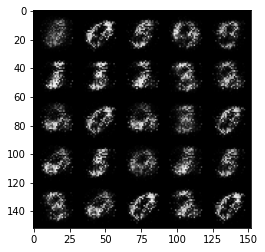

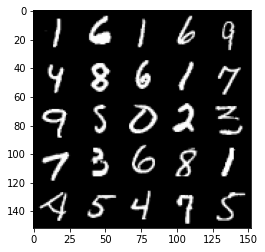

Step 5000: Generator loss: 3.392220658779141, discriminator loss: 0.08319538404047493


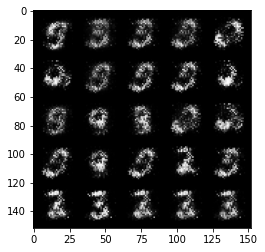

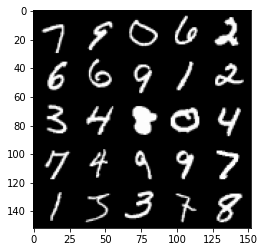

Step 5500: Generator loss: 3.4632918314933785, discriminator loss: 0.08026644463837138


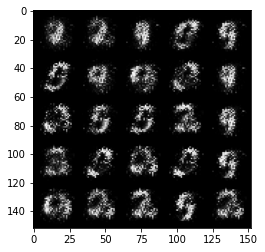

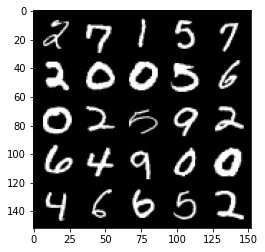

Step 6000: Generator loss: 4.204485265731817, discriminator loss: 0.05600513745099305


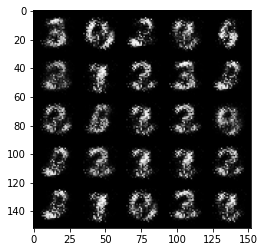

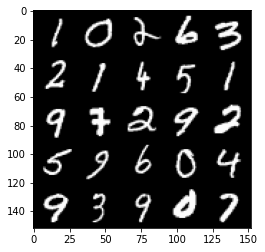

Step 6500: Generator loss: 4.068843887805937, discriminator loss: 0.055598402176052296


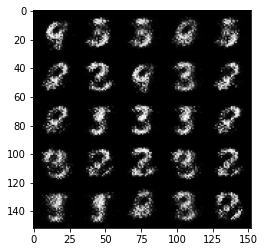

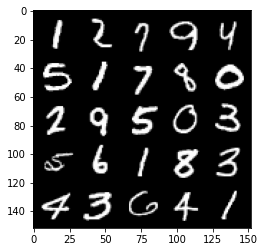

Step 7000: Generator loss: 4.038226229667665, discriminator loss: 0.049082608614116924


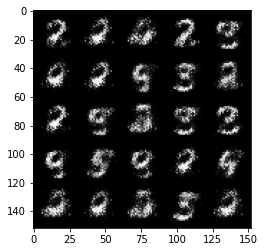

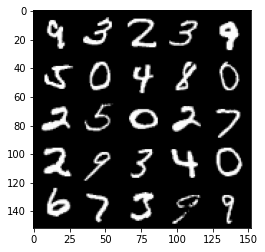

Step 7500: Generator loss: 4.050707301616673, discriminator loss: 0.047023733183741555


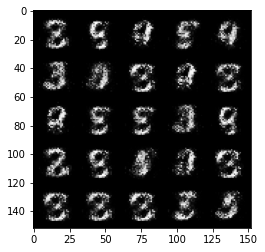

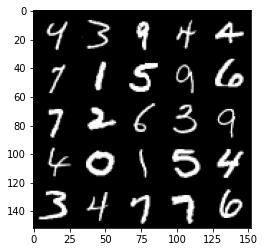

Step 8000: Generator loss: 4.073686354637146, discriminator loss: 0.05537437761202452


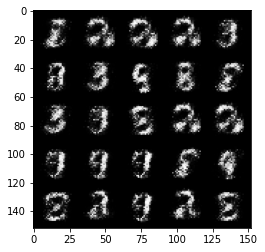

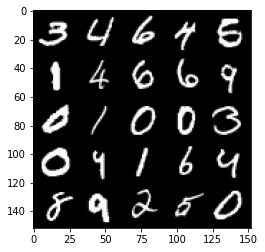

Step 8500: Generator loss: 4.340003712177277, discriminator loss: 0.05494166021049022


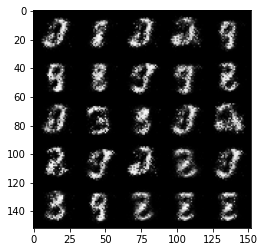

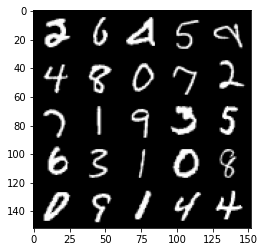

Step 9000: Generator loss: 4.3041608238220235, discriminator loss: 0.06359486998990174


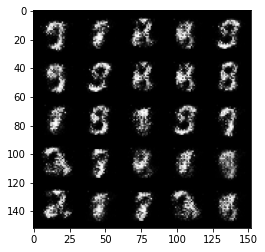

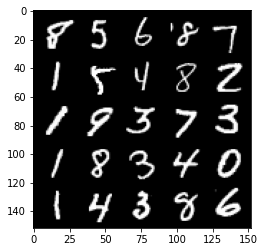

Step 9500: Generator loss: 4.068630580425263, discriminator loss: 0.055227841850370184


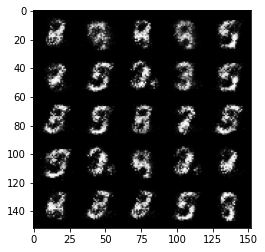

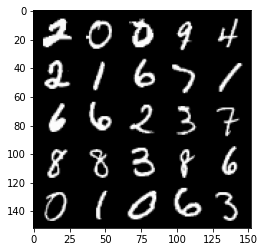

Step 10000: Generator loss: 4.03933749008179, discriminator loss: 0.06064211648330096


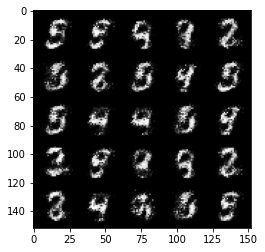

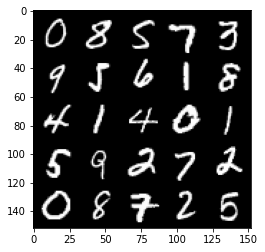

Step 10500: Generator loss: 3.817460878372197, discriminator loss: 0.06665424880385397


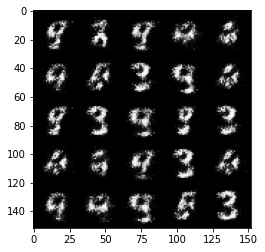

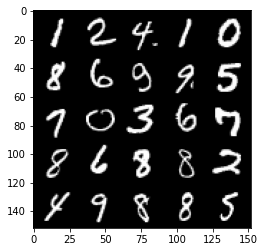

Step 11000: Generator loss: 3.8619004993438732, discriminator loss: 0.05985114654898646


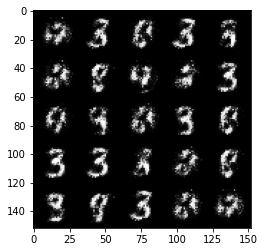

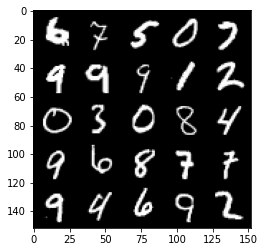

Step 11500: Generator loss: 4.134448988437653, discriminator loss: 0.06107102692499756


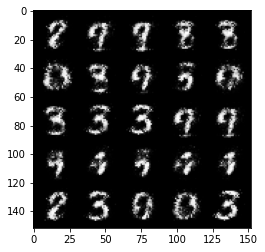

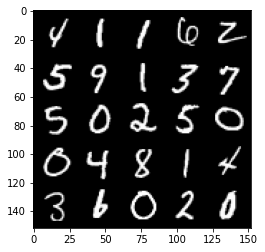

Step 12000: Generator loss: 3.925868651866913, discriminator loss: 0.0644654610082507


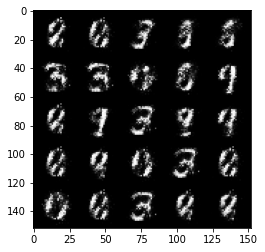

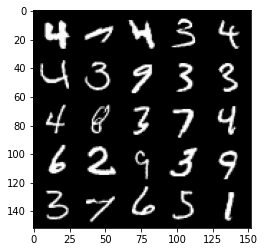

Step 12500: Generator loss: 3.82849585199356, discriminator loss: 0.08049662378802896


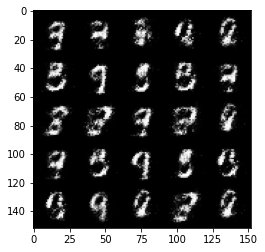

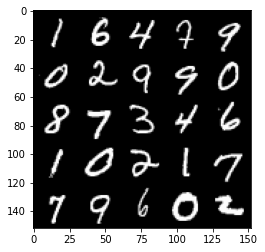

Step 13000: Generator loss: 4.004948114871982, discriminator loss: 0.06033272216469051


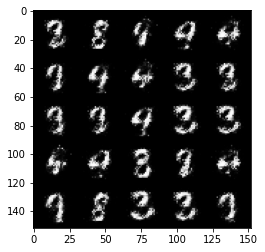

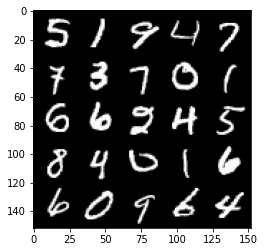

Step 13500: Generator loss: 3.991756559848786, discriminator loss: 0.0628693657964468


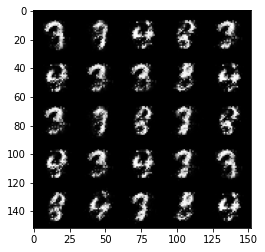

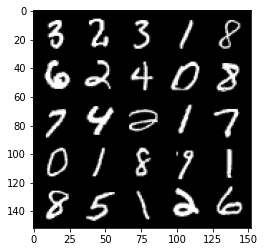

Step 14000: Generator loss: 4.295691443443301, discriminator loss: 0.06807046913728117


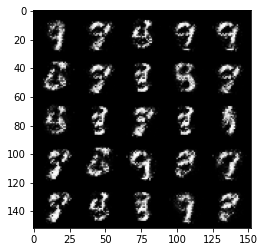

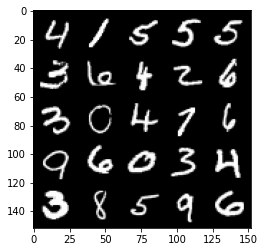

Step 14500: Generator loss: 4.243748655796051, discriminator loss: 0.07756059098243717


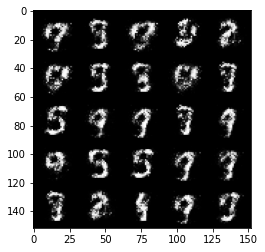

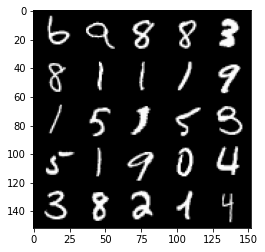

Step 15000: Generator loss: 4.155211697101594, discriminator loss: 0.08607105321437115


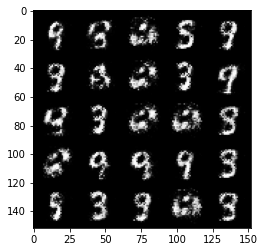

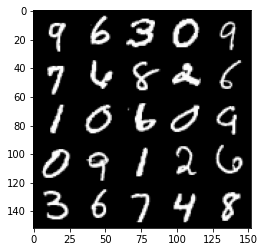

Step 15500: Generator loss: 4.001801497459408, discriminator loss: 0.08352404256165027


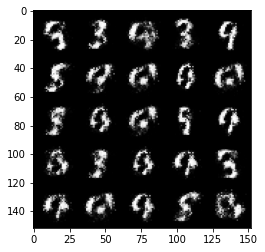

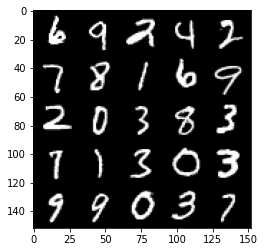

Step 16000: Generator loss: 4.148941348075863, discriminator loss: 0.09099338043481116


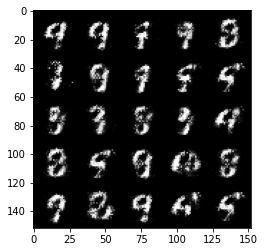

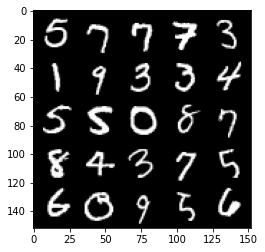

Step 16500: Generator loss: 4.05331771659851, discriminator loss: 0.09186498554423449


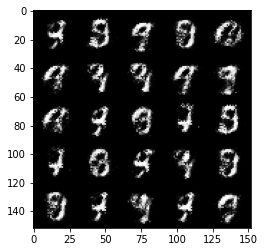

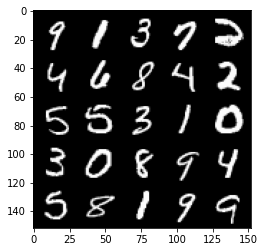

Step 17000: Generator loss: 3.975345232009886, discriminator loss: 0.0769617778286338


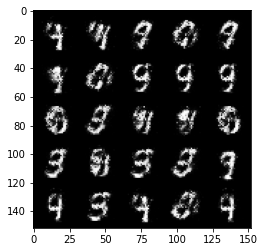

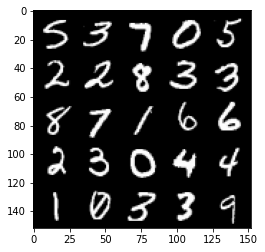

Step 17500: Generator loss: 3.794604582309721, discriminator loss: 0.10367881536483761


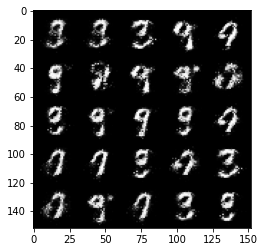

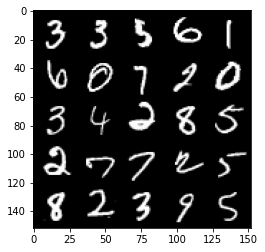

Step 18000: Generator loss: 3.822978236198428, discriminator loss: 0.09894926045089956


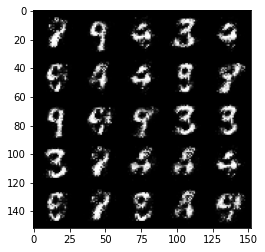

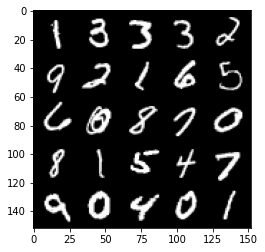

Step 18500: Generator loss: 4.1225018777847255, discriminator loss: 0.08750221142172813


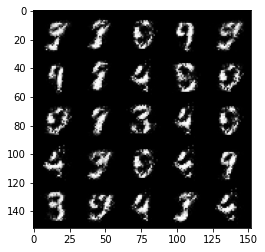

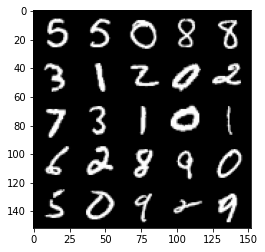

Step 19000: Generator loss: 3.971440027236942, discriminator loss: 0.09844814044237137


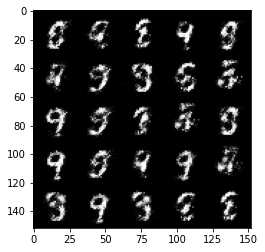

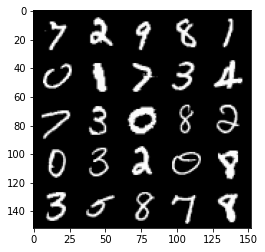

Step 19500: Generator loss: 3.8487912764549264, discriminator loss: 0.09981851728260521


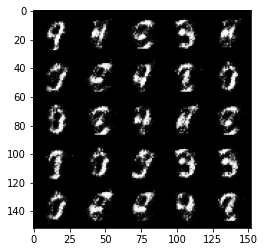

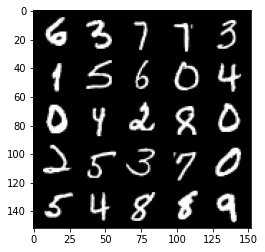

Step 20000: Generator loss: 3.797263565063473, discriminator loss: 0.09809532119333739


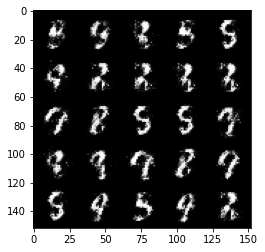

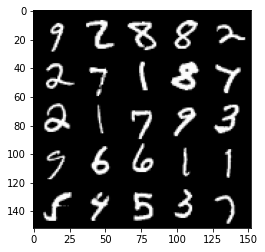

Step 20500: Generator loss: 3.7743932180404665, discriminator loss: 0.09968249199539411


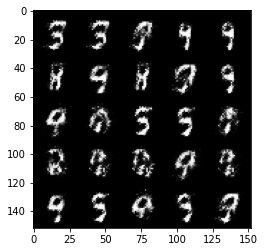

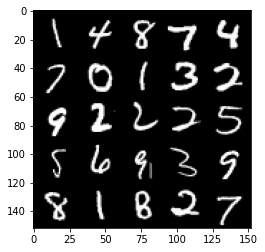

Step 21000: Generator loss: 3.937411027908326, discriminator loss: 0.10016246009618042


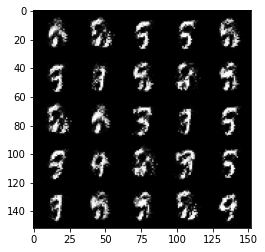

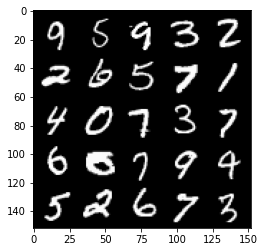

Step 21500: Generator loss: 3.958091444492343, discriminator loss: 0.09207153001427651


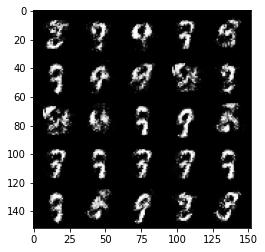

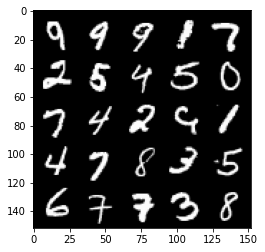

Step 22000: Generator loss: 3.6232181301116966, discriminator loss: 0.11474191928654913


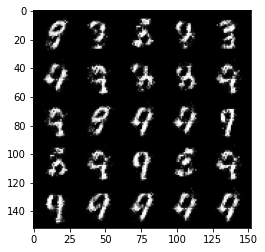

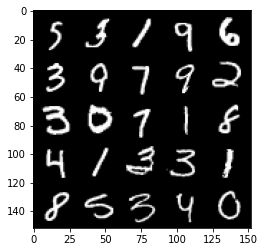

Step 22500: Generator loss: 3.7403063173294044, discriminator loss: 0.1071426062062382


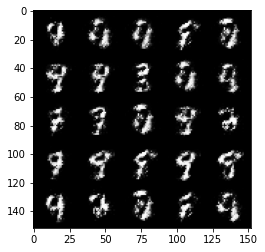

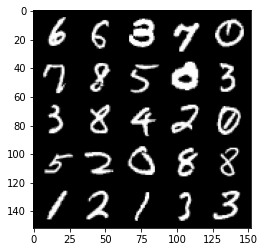

Step 23000: Generator loss: 3.7603554053306585, discriminator loss: 0.11263051987439407


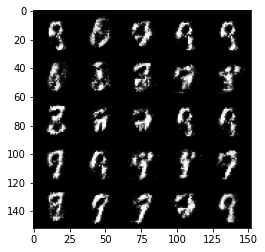

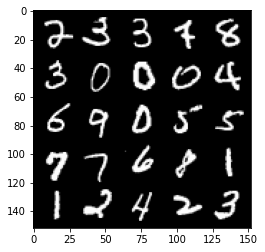

Step 23500: Generator loss: 3.374451228618619, discriminator loss: 0.144991090402007


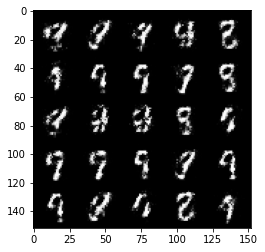

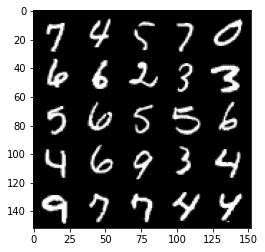

Step 24000: Generator loss: 3.507525685310361, discriminator loss: 0.11796390734612937


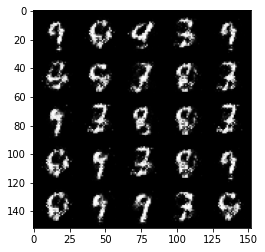

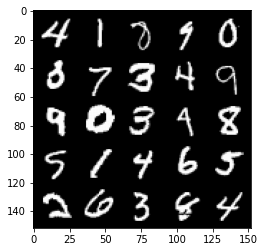

Step 24500: Generator loss: 3.4820685176849357, discriminator loss: 0.1320253176838159


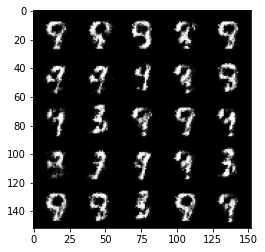

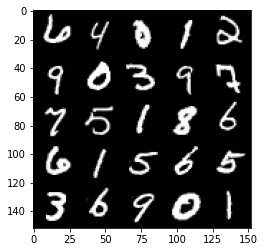

Step 25000: Generator loss: 3.3486546611785846, discriminator loss: 0.13117349365353578


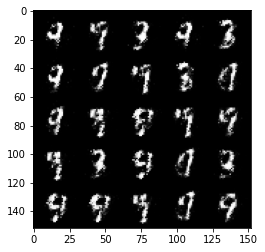

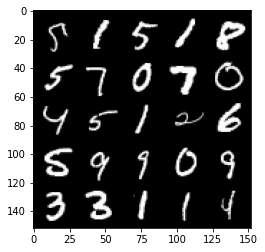

Step 25500: Generator loss: 3.2368192377090463, discriminator loss: 0.16075807430595165


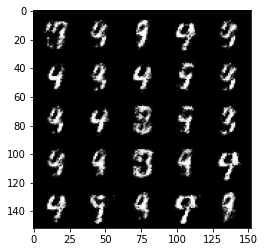

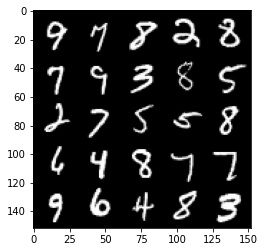

Step 26000: Generator loss: 3.2757445445060753, discriminator loss: 0.12902495343238118


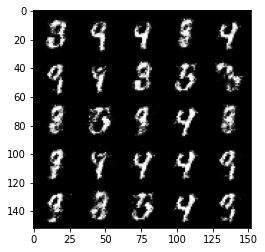

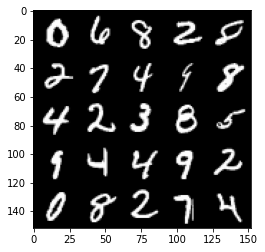

Step 26500: Generator loss: 3.435184276103972, discriminator loss: 0.13150690977275356


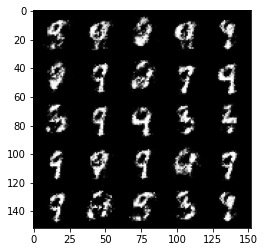

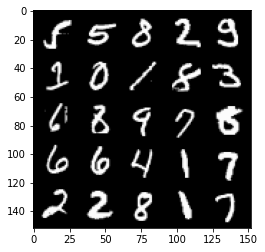

Step 27000: Generator loss: 3.290908349990845, discriminator loss: 0.14152370105683812


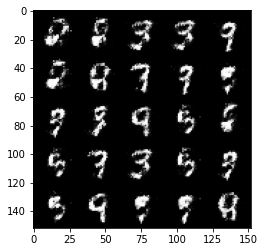

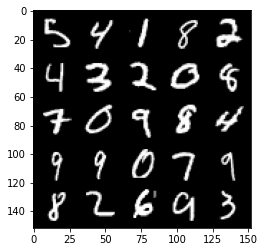

Step 27500: Generator loss: 3.235094428539277, discriminator loss: 0.15249344134330745


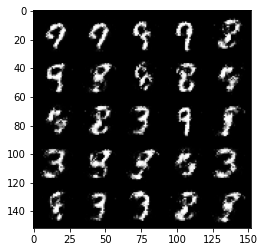

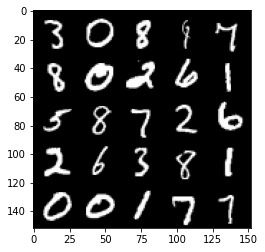

Step 28000: Generator loss: 3.024781624317172, discriminator loss: 0.16338335981965055


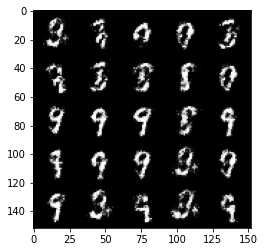

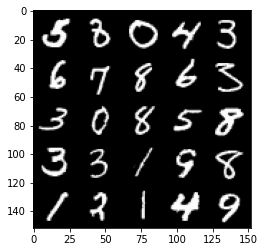

Step 28500: Generator loss: 3.2654251618385333, discriminator loss: 0.14310239637643088


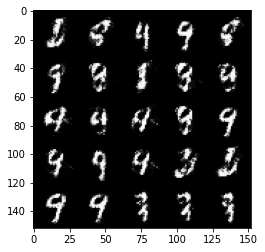

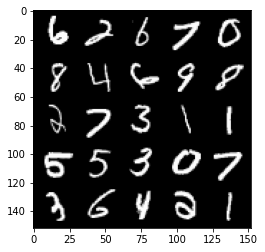

Step 29000: Generator loss: 3.313228331089019, discriminator loss: 0.14362127811461672


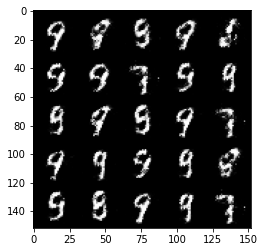

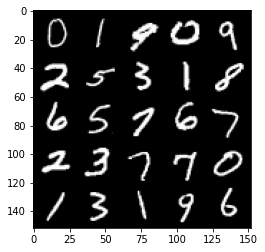

Step 29500: Generator loss: 3.2589943346977193, discriminator loss: 0.14992342457175262


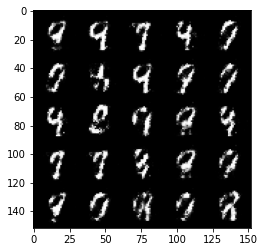

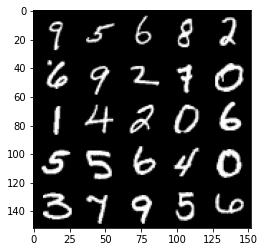

Step 30000: Generator loss: 3.159321167469026, discriminator loss: 0.1514294470250607


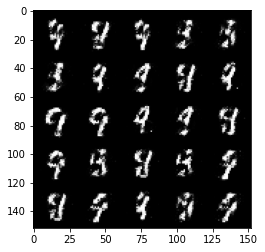

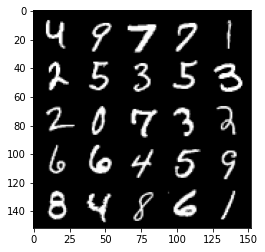

Step 30500: Generator loss: 3.219432776451109, discriminator loss: 0.1423041037172078


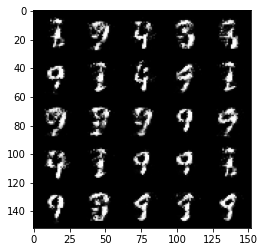

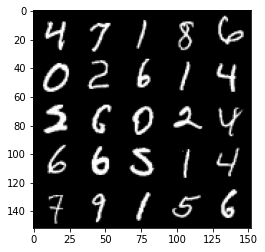

Step 31000: Generator loss: 3.1855703635215775, discriminator loss: 0.1438609882742167


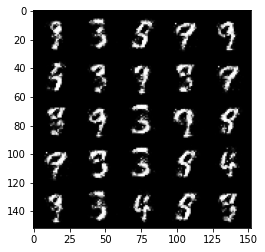

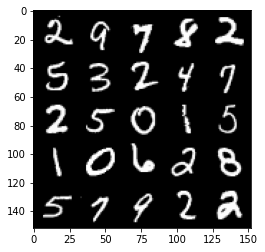

Step 31500: Generator loss: 3.223760152816774, discriminator loss: 0.14439855024218556


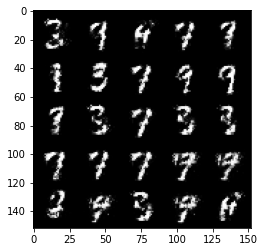

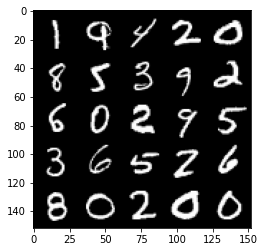

Step 32000: Generator loss: 3.039258213996886, discriminator loss: 0.15957872885465615


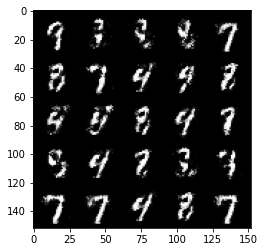

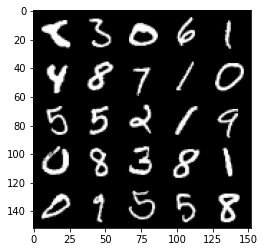

Step 32500: Generator loss: 3.045650375843048, discriminator loss: 0.16715839584171768


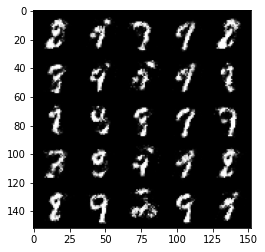

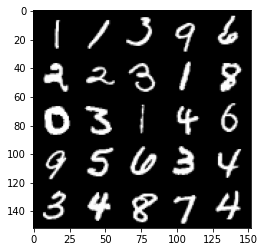

Step 33000: Generator loss: 2.9278814773559603, discriminator loss: 0.16921164779365067


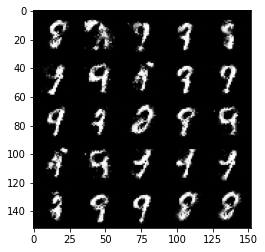

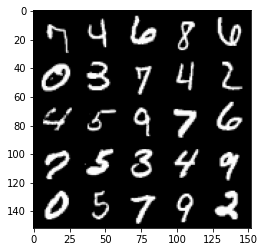

Step 33500: Generator loss: 2.838212559223178, discriminator loss: 0.18416664373874683


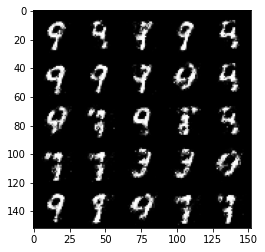

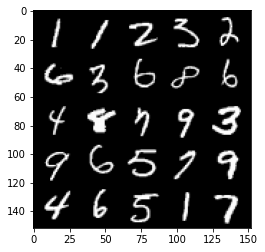

Step 34000: Generator loss: 2.8625748190879787, discriminator loss: 0.17550549831986428


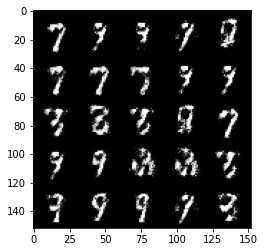

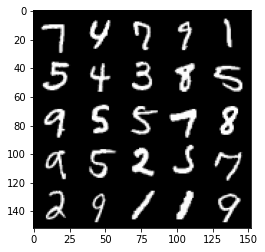

Step 34500: Generator loss: 2.8625172343254115, discriminator loss: 0.181073277696967


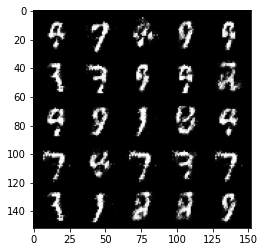

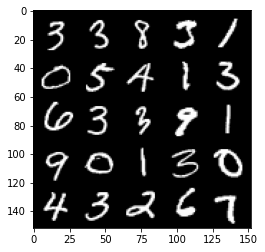

Step 35000: Generator loss: 2.803885586261748, discriminator loss: 0.17694547051191337


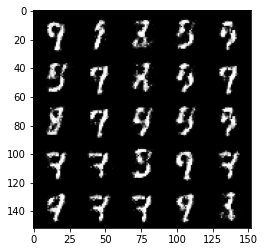

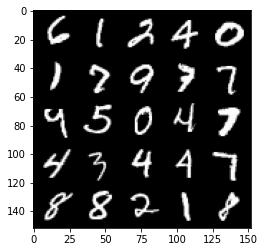

Step 35500: Generator loss: 2.8569809598922715, discriminator loss: 0.18986608929932117


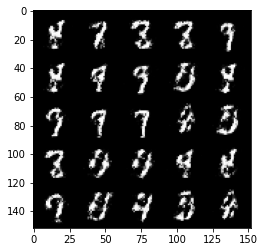

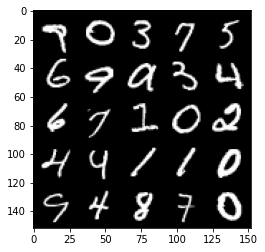

Step 36000: Generator loss: 2.7780581097602863, discriminator loss: 0.19288269664347163


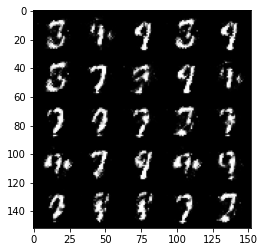

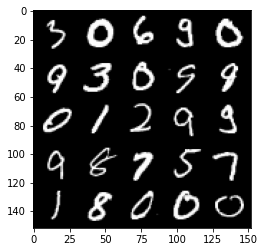

Step 36500: Generator loss: 2.7578424215316732, discriminator loss: 0.18115870454907415


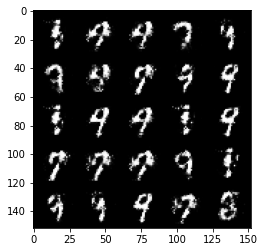

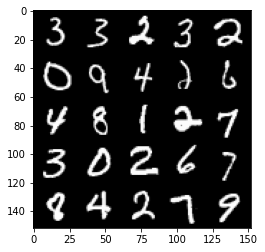

Step 37000: Generator loss: 2.933808448791502, discriminator loss: 0.17065758840739725


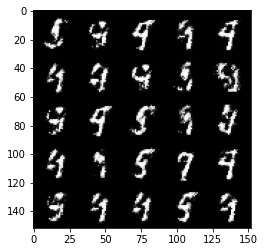

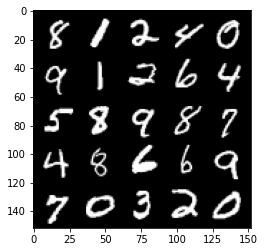

Step 37500: Generator loss: 2.9226897501945506, discriminator loss: 0.1657368631809951


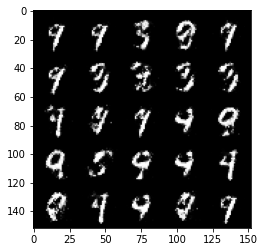

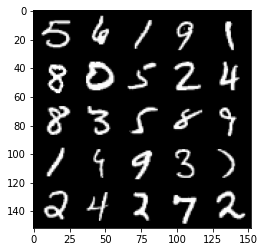

Step 38000: Generator loss: 2.899291179656984, discriminator loss: 0.16814128591120245


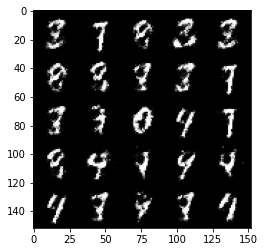

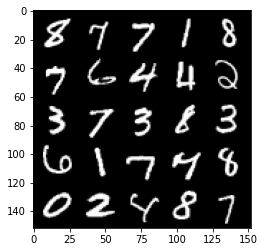

Step 38500: Generator loss: 2.768284463405612, discriminator loss: 0.1841154655069116


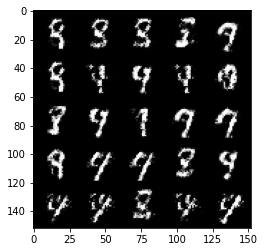

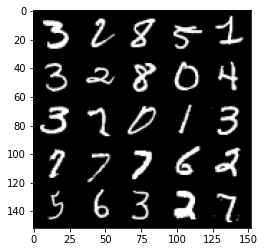

Step 39000: Generator loss: 2.7681998333930973, discriminator loss: 0.18692575255036356


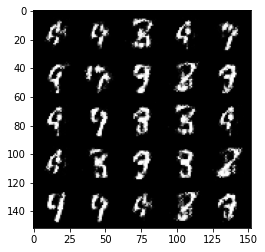

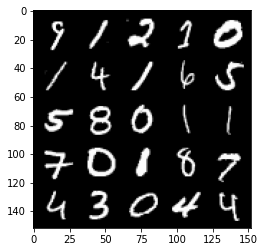

Step 39500: Generator loss: 2.951399242401123, discriminator loss: 0.16433982418477522


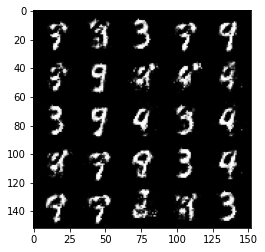

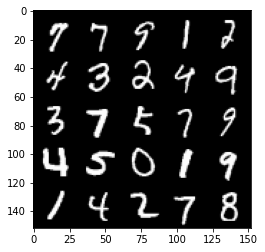

Step 40000: Generator loss: 2.592348005294799, discriminator loss: 0.21887515400350113


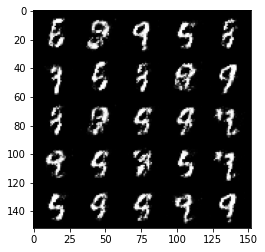

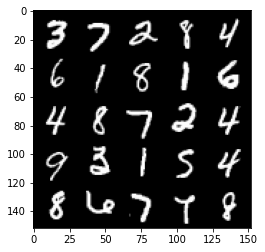

Step 40500: Generator loss: 2.499276208400725, discriminator loss: 0.22512073537707353


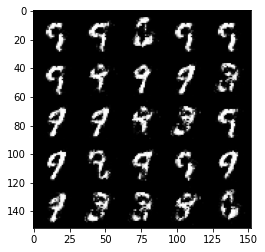

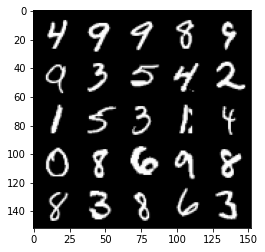

Step 41000: Generator loss: 2.603937722682953, discriminator loss: 0.21191201807558555


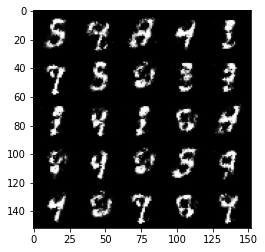

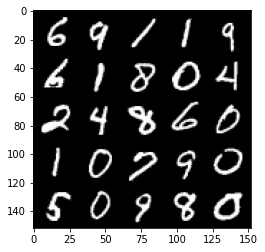

Step 41500: Generator loss: 2.5702376146316515, discriminator loss: 0.21706219944357877


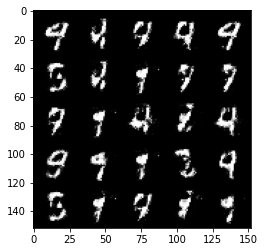

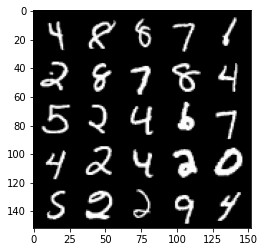

Step 42000: Generator loss: 2.4934638857841462, discriminator loss: 0.22168932172656058


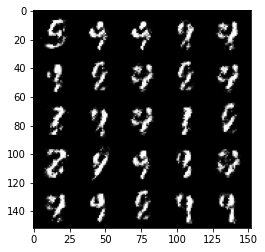

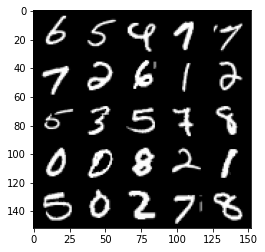

Step 42500: Generator loss: 2.5952213983535746, discriminator loss: 0.20457827688753621


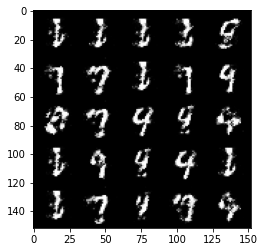

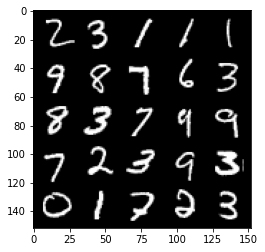

Step 43000: Generator loss: 2.580982137203217, discriminator loss: 0.21112742593884476


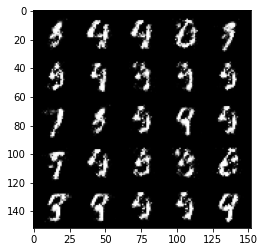

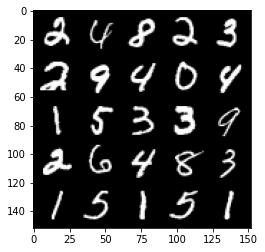

Step 43500: Generator loss: 2.7457899270057675, discriminator loss: 0.21104984815418726


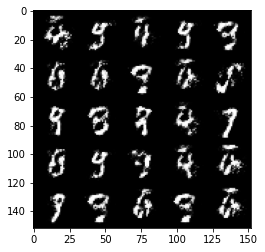

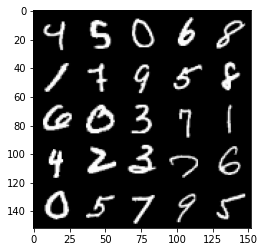

Step 44000: Generator loss: 2.685619162559507, discriminator loss: 0.18780501124262813


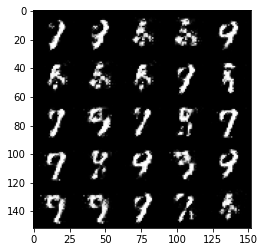

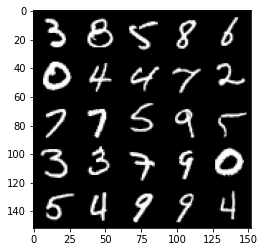

Step 44500: Generator loss: 2.740348396778107, discriminator loss: 0.18990655538439752


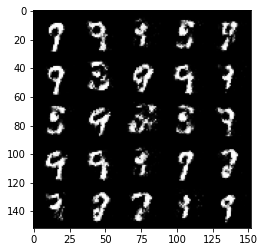

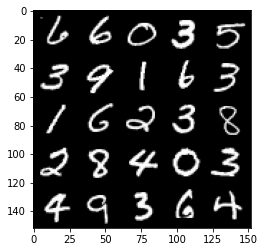

Step 45000: Generator loss: 2.587027754783632, discriminator loss: 0.20165420195460326


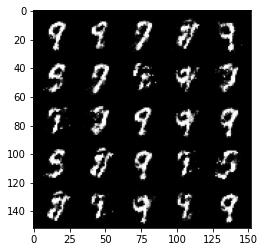

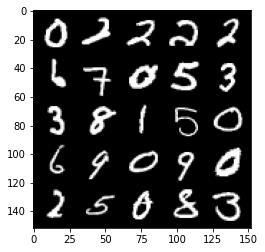

Step 45500: Generator loss: 2.635576330661774, discriminator loss: 0.22344518573582176


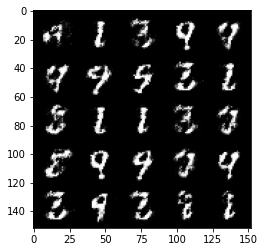

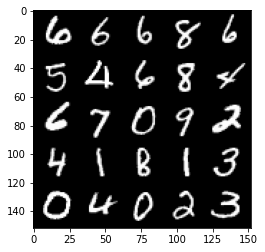

Step 46000: Generator loss: 2.485252453804016, discriminator loss: 0.23034608140587828


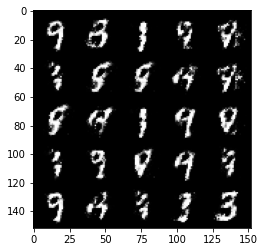

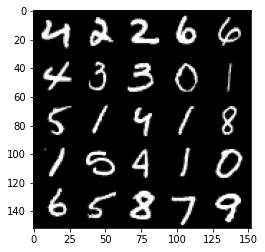

Step 46500: Generator loss: 2.490683936357497, discriminator loss: 0.21461745834350573


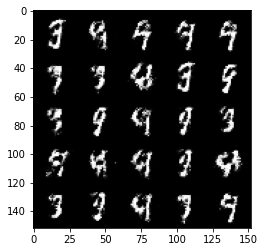

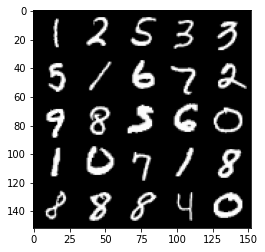

Step 47000: Generator loss: 2.6361840476989724, discriminator loss: 0.20029492585361


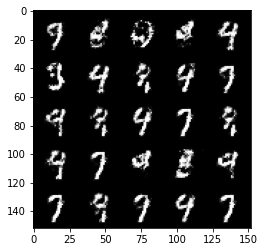

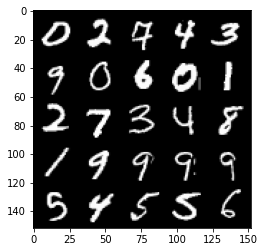

Step 47500: Generator loss: 2.538387759685514, discriminator loss: 0.2325619590133429


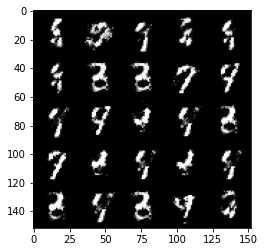

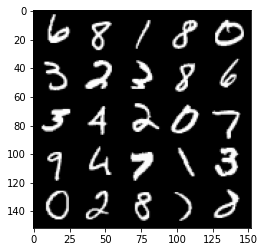

Step 48000: Generator loss: 2.497880000114441, discriminator loss: 0.21350902533531202


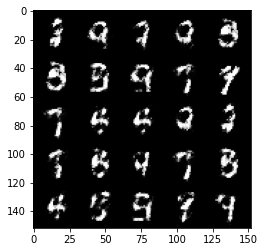

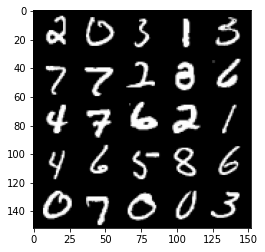

Step 48500: Generator loss: 2.541819251060483, discriminator loss: 0.21560895070433608


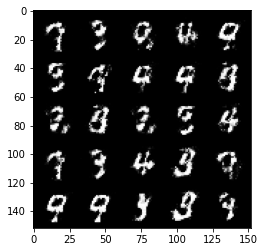

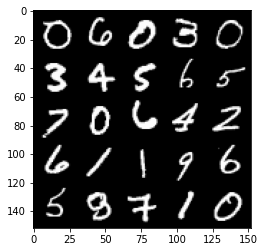

Step 49000: Generator loss: 2.597250205516814, discriminator loss: 0.218443553417921


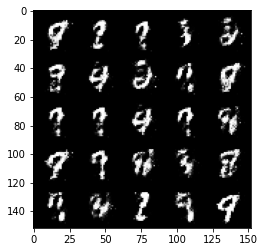

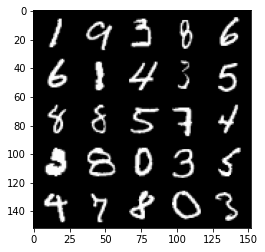

Step 49500: Generator loss: 2.4887709608078015, discriminator loss: 0.22565948218107232


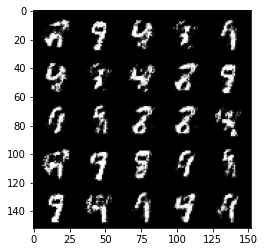

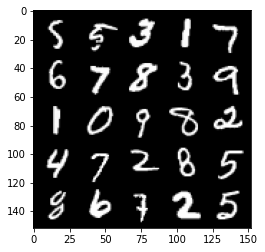

Step 50000: Generator loss: 2.5697525887489334, discriminator loss: 0.20304168754816088


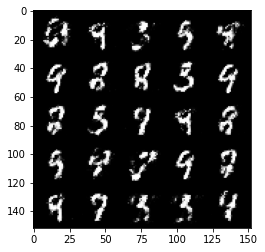

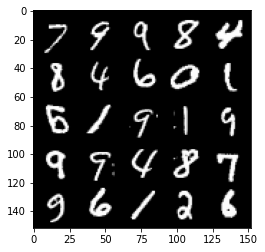

Step 50500: Generator loss: 2.7008677320480357, discriminator loss: 0.19932290840148914


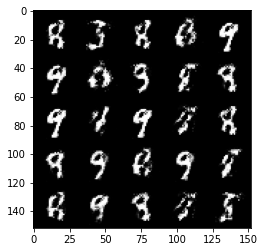

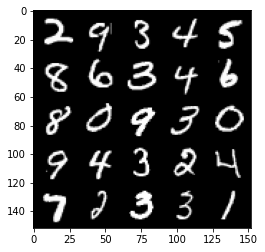

Step 51000: Generator loss: 2.562052764892576, discriminator loss: 0.2128814422041178


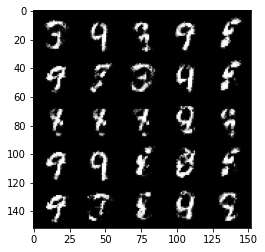

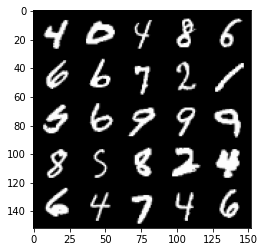

Step 51500: Generator loss: 2.5764368386268623, discriminator loss: 0.2097672964334485


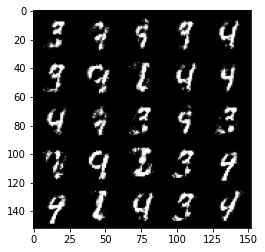

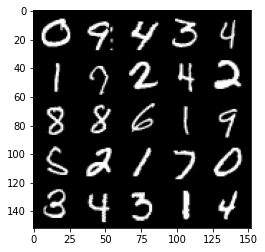

Step 52000: Generator loss: 2.506318268537523, discriminator loss: 0.22913702777028097


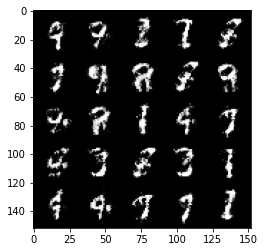

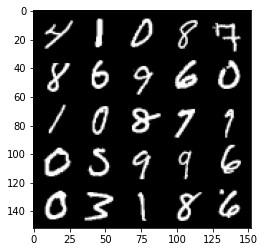

Step 52500: Generator loss: 2.2113215265274064, discriminator loss: 0.27592346248030664


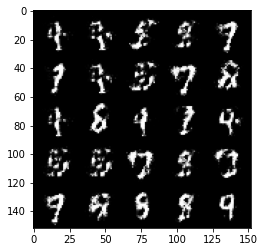

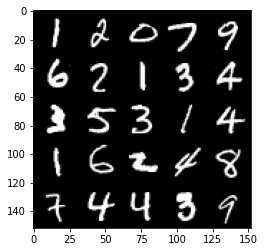

Step 53000: Generator loss: 2.4795124287605264, discriminator loss: 0.20980686707794652


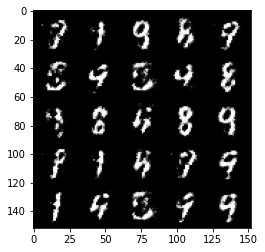

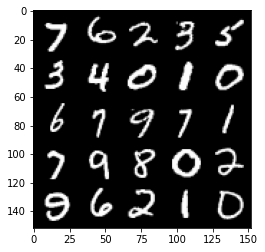

Step 53500: Generator loss: 2.5844608650207546, discriminator loss: 0.20391884800791732


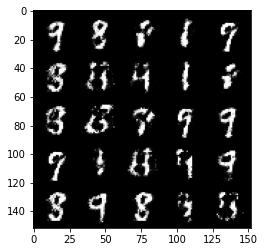

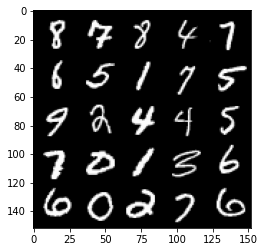

Step 54000: Generator loss: 2.5340263519287083, discriminator loss: 0.22097978413105002


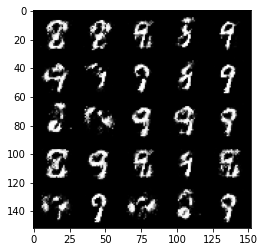

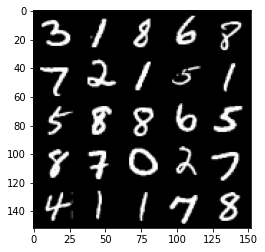

Step 54500: Generator loss: 2.5000296897888177, discriminator loss: 0.22586064338684075


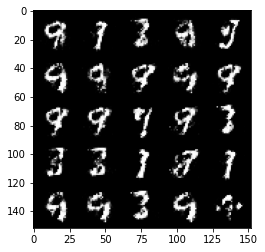

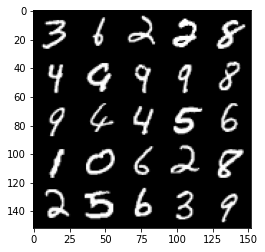

Step 55000: Generator loss: 2.4862800211906437, discriminator loss: 0.21712214563787002


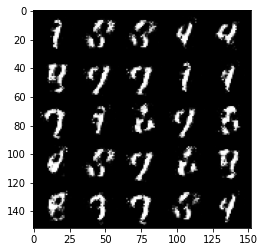

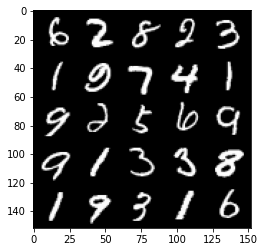

Step 55500: Generator loss: 2.4003073961734778, discriminator loss: 0.23833857104182235


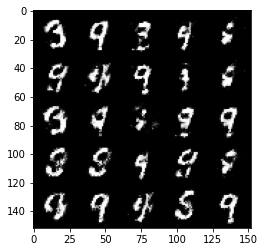

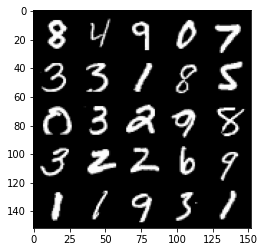

Step 56000: Generator loss: 2.4358715331554426, discriminator loss: 0.23583682665228844


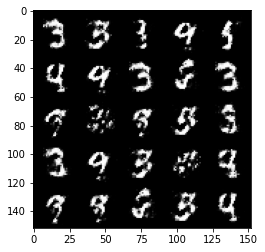

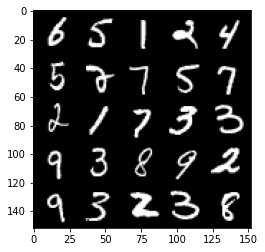

Step 56500: Generator loss: 2.488028090476993, discriminator loss: 0.21752936112880722


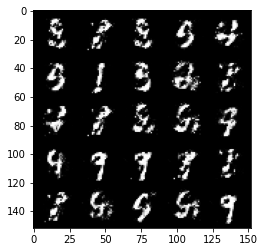

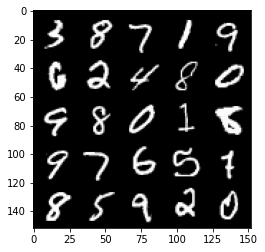

Step 57000: Generator loss: 2.48667706537247, discriminator loss: 0.23171350519359107


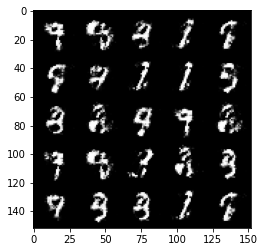

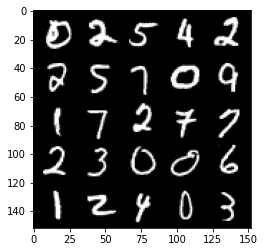

Step 57500: Generator loss: 2.3308227274417863, discriminator loss: 0.24401285931468014


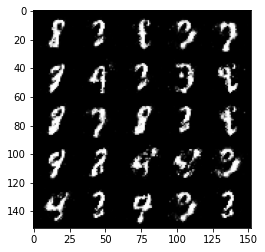

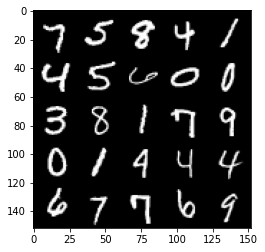

Step 58000: Generator loss: 2.520483294725421, discriminator loss: 0.21227609834074945


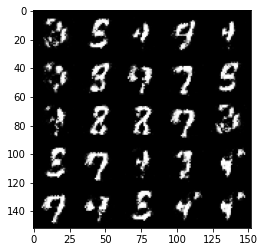

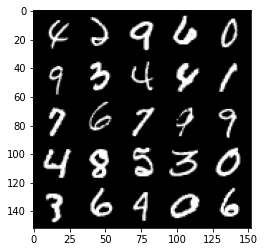

Step 58500: Generator loss: 2.3499834566116364, discriminator loss: 0.2422224698662759


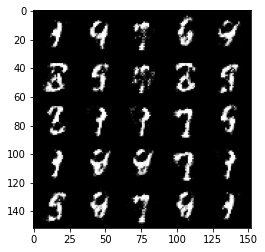

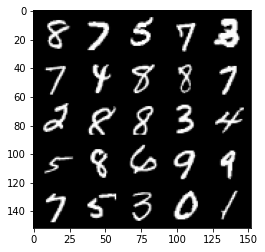

Step 59000: Generator loss: 2.3291507453918463, discriminator loss: 0.23822699496150024


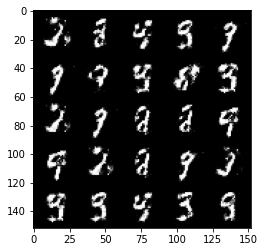

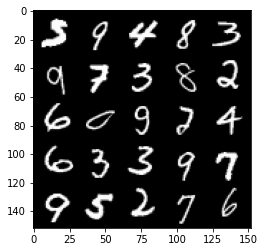

Step 59500: Generator loss: 2.392239378929139, discriminator loss: 0.25114580458402613


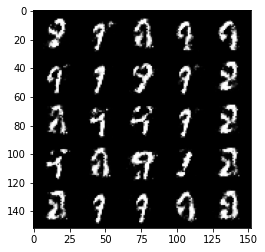

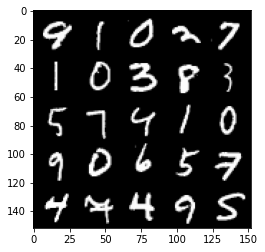

Step 60000: Generator loss: 2.310317227602006, discriminator loss: 0.24060524335503555


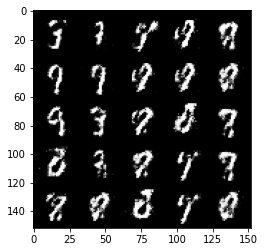

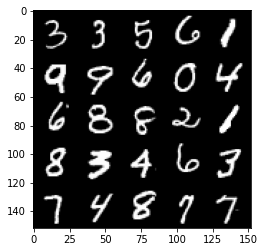

Step 60500: Generator loss: 2.493565760135649, discriminator loss: 0.21414554989337936


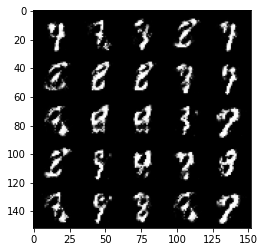

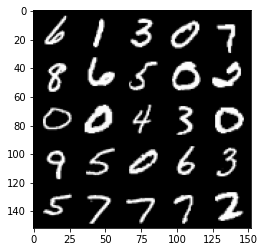

Step 61000: Generator loss: 2.3774398555755623, discriminator loss: 0.23710156720876693


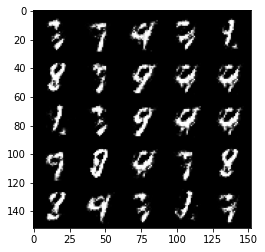

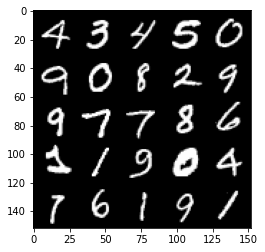

Step 61500: Generator loss: 2.387914311885832, discriminator loss: 0.23107498675584792


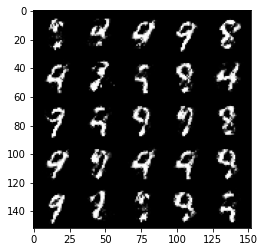

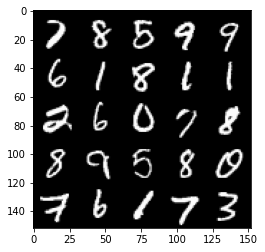

Step 62000: Generator loss: 2.17021273136139, discriminator loss: 0.28451897889375694


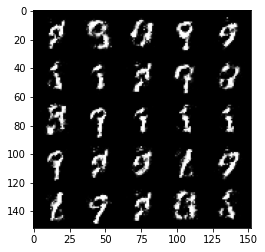

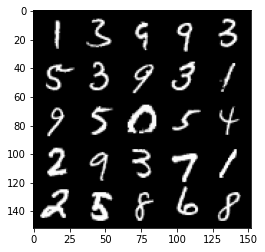

Step 62500: Generator loss: 2.3847248334884648, discriminator loss: 0.23595385310053832


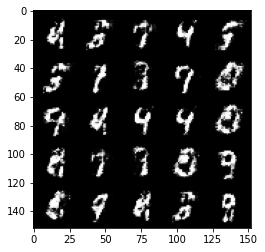

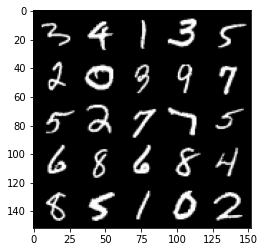

Step 63000: Generator loss: 2.4089980139732345, discriminator loss: 0.2304520894885061


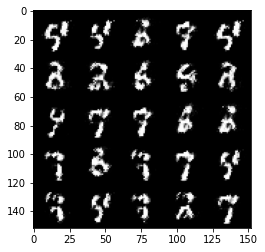

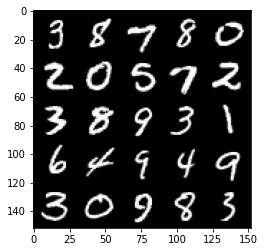

Step 63500: Generator loss: 2.3866193237304683, discriminator loss: 0.23777143737673753


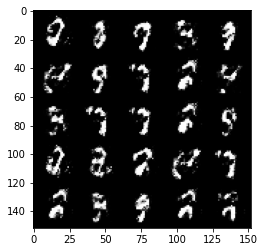

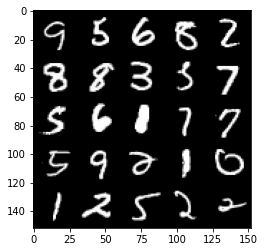

Step 64000: Generator loss: 2.3114101710319517, discriminator loss: 0.2551295665800571


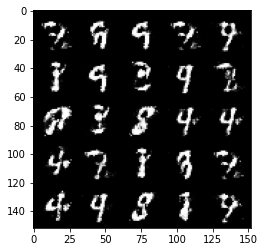

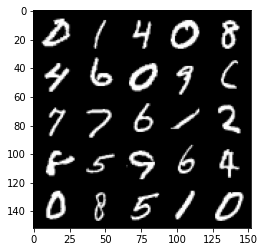

Step 64500: Generator loss: 2.2448092935085286, discriminator loss: 0.25097001856565465


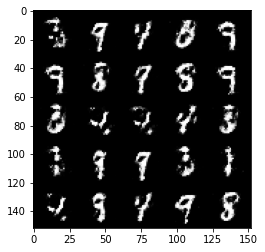

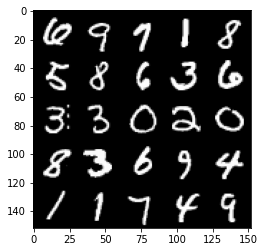

Step 65000: Generator loss: 2.2110713229179395, discriminator loss: 0.2598926487863066


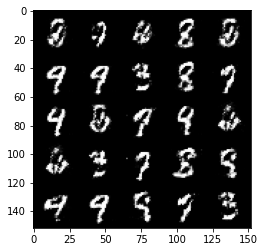

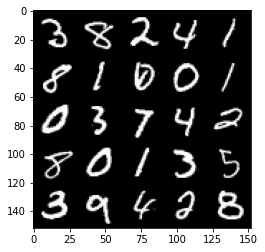

Step 65500: Generator loss: 2.1624300611019134, discriminator loss: 0.27565441948175406


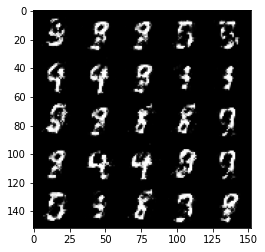

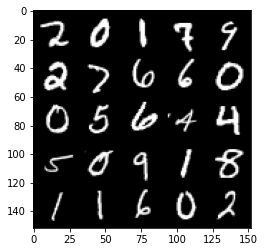

Step 66000: Generator loss: 2.1820361800193773, discriminator loss: 0.2639854388833047


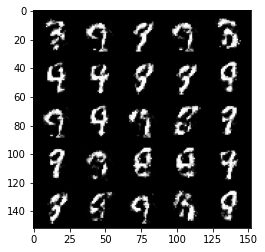

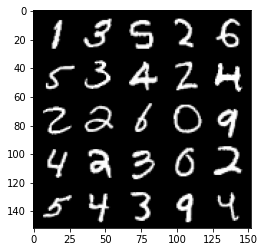

Step 66500: Generator loss: 2.1768407766818996, discriminator loss: 0.2703543133735659


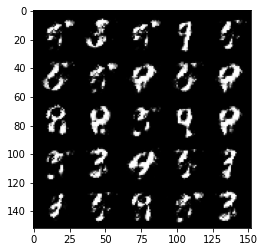

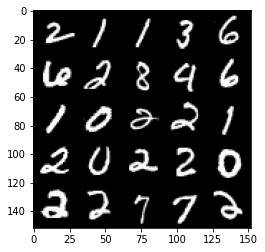

Step 67000: Generator loss: 2.1358645989894876, discriminator loss: 0.2724175598621367


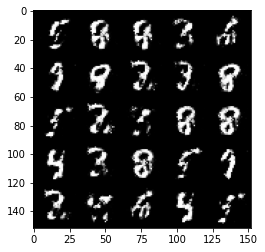

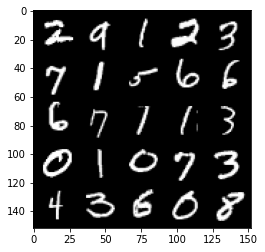

Step 67500: Generator loss: 2.0846894314289104, discriminator loss: 0.28361443451046936


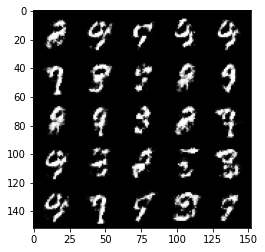

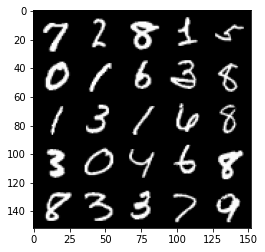

Step 68000: Generator loss: 2.0522018663883212, discriminator loss: 0.2793058839142322


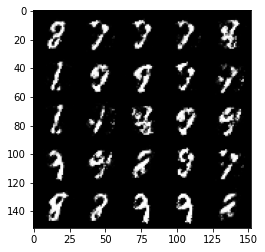

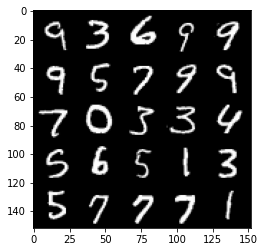

Step 68500: Generator loss: 2.1003307962417597, discriminator loss: 0.29003927141427993


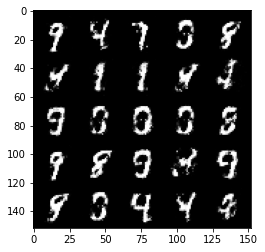

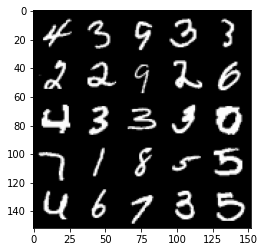

Step 69000: Generator loss: 2.171345245599748, discriminator loss: 0.2720610707104205


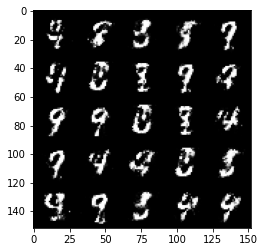

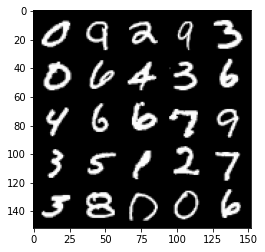

Step 69500: Generator loss: 2.164921298742297, discriminator loss: 0.2805849559307096


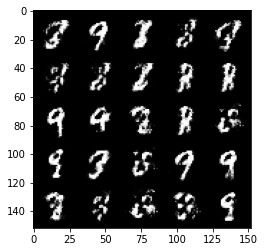

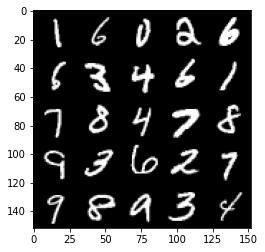

Step 70000: Generator loss: 2.067807611703873, discriminator loss: 0.2807643365561961


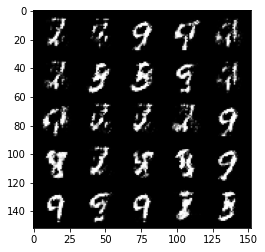

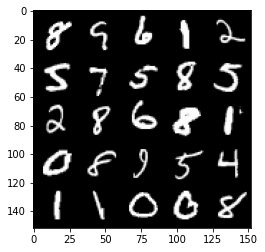

Step 70500: Generator loss: 1.9704903120994557, discriminator loss: 0.30820486989617357


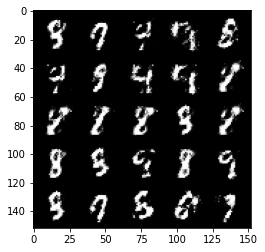

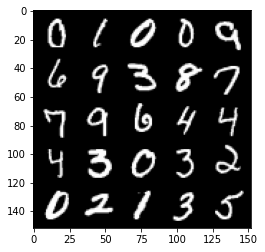

Step 71000: Generator loss: 1.8977134552001955, discriminator loss: 0.31932115188241


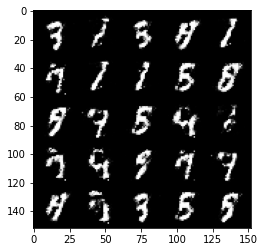

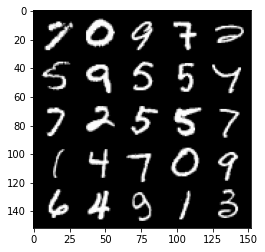

Step 71500: Generator loss: 1.873065797328951, discriminator loss: 0.32525446587801005


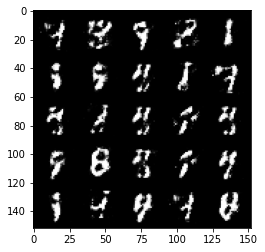

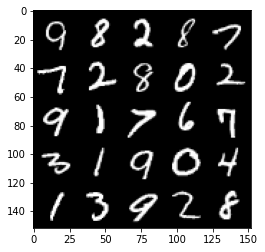

Step 72000: Generator loss: 1.7905057463645928, discriminator loss: 0.34453582975268365


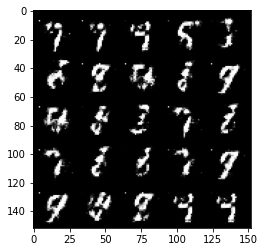

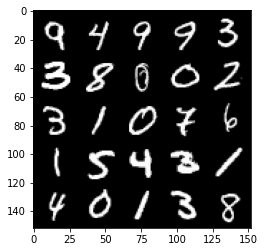

Step 72500: Generator loss: 1.9514192135334028, discriminator loss: 0.30439540857076675


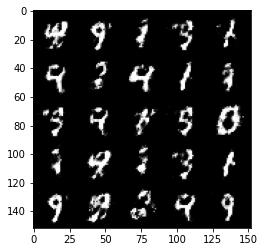

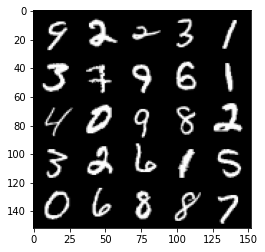

Step 73000: Generator loss: 2.06223031568527, discriminator loss: 0.2791873447000981


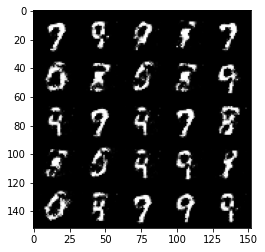

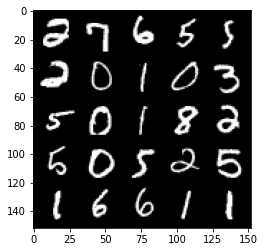

Step 73500: Generator loss: 2.0881141998767827, discriminator loss: 0.27930252903699887


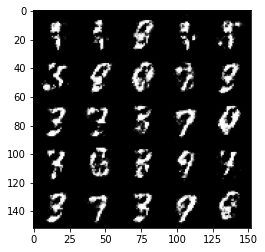

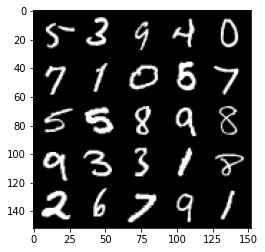

Step 74000: Generator loss: 2.0673190715312963, discriminator loss: 0.30048352456092825


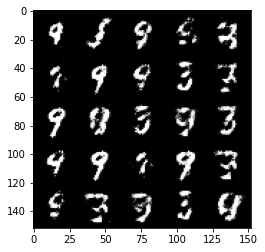

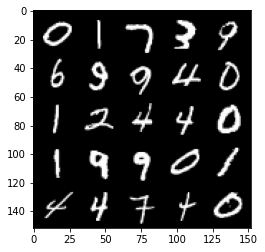

Step 74500: Generator loss: 2.019576202154161, discriminator loss: 0.283398319900036


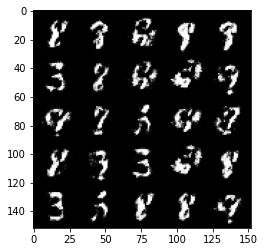

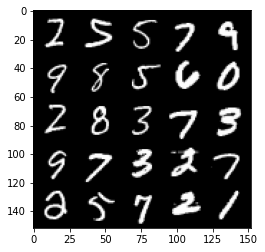

Step 75000: Generator loss: 1.9959965689182295, discriminator loss: 0.29926753237843506


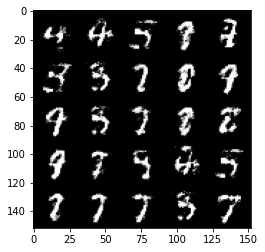

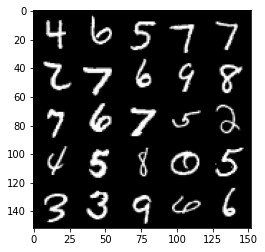

Step 75500: Generator loss: 2.0332049615383134, discriminator loss: 0.2774532142579551


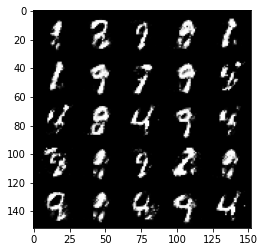

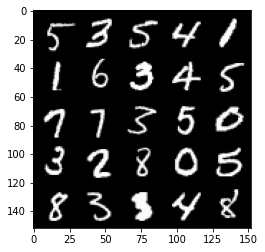

Step 76000: Generator loss: 2.002356752395628, discriminator loss: 0.29576237618923173


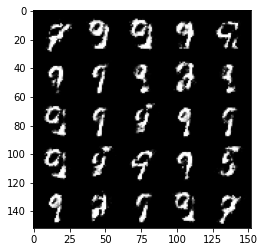

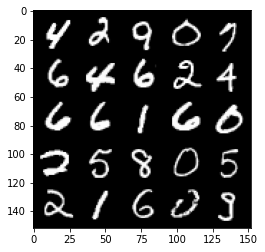

Step 76500: Generator loss: 2.043215394020082, discriminator loss: 0.2831170079410077


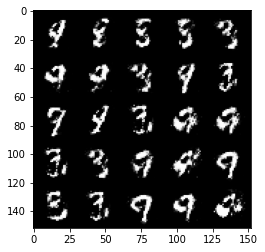

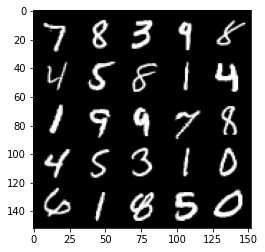

Step 77000: Generator loss: 2.055589426994324, discriminator loss: 0.27871819427609457


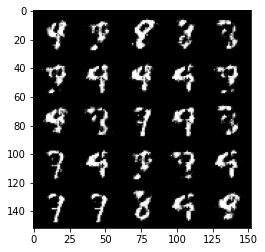

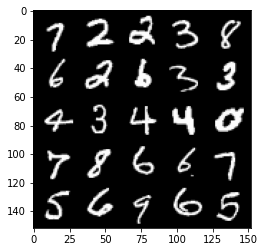

Step 77500: Generator loss: 2.194750777721405, discriminator loss: 0.255490960806608


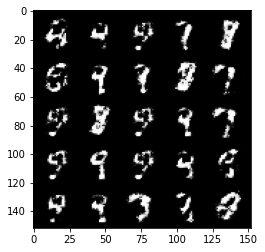

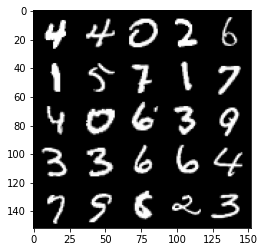

Step 78000: Generator loss: 2.1020000321865067, discriminator loss: 0.2819236982762812


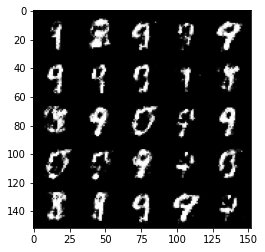

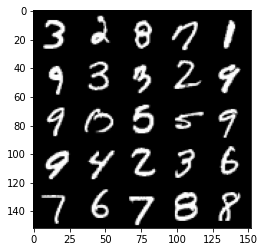

Step 78500: Generator loss: 1.966784126758576, discriminator loss: 0.30139200145006206


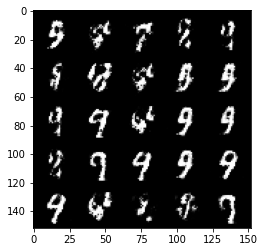

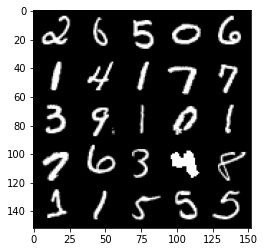

Step 79000: Generator loss: 1.938749430179596, discriminator loss: 0.2967198111712933


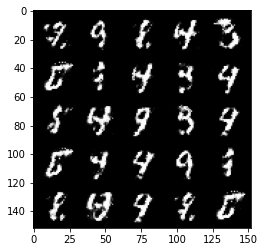

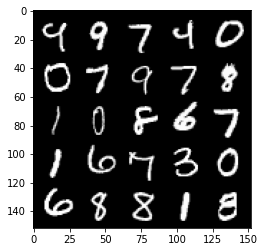

Step 79500: Generator loss: 1.9411306784152973, discriminator loss: 0.30761523017287223


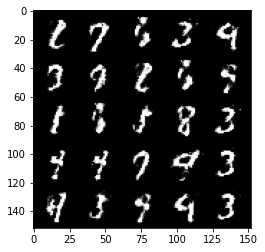

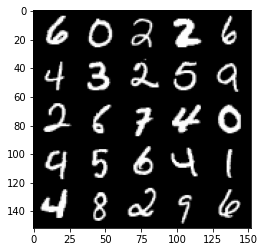

Step 80000: Generator loss: 1.963842734336852, discriminator loss: 0.3135311665832998


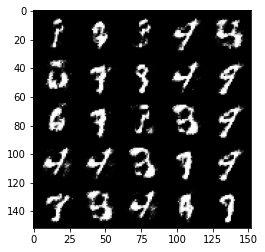

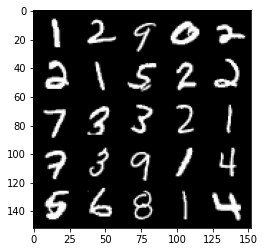

Step 80500: Generator loss: 1.9836586439609523, discriminator loss: 0.28026488417387024


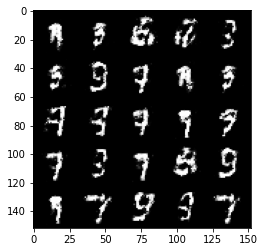

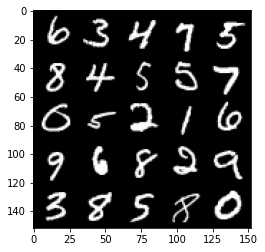

Step 81000: Generator loss: 2.039197849273681, discriminator loss: 0.2983652269542218


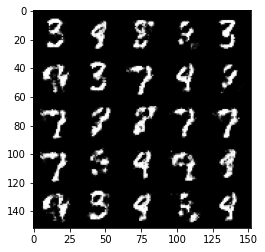

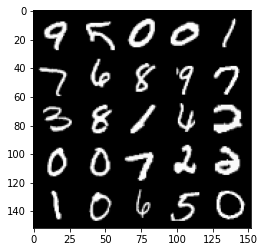

Step 81500: Generator loss: 1.9695988011360175, discriminator loss: 0.2907551131248473


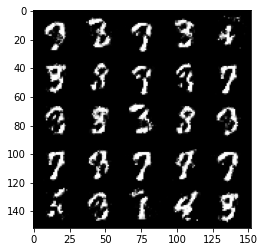

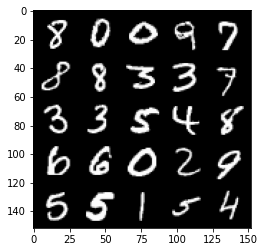

Step 82000: Generator loss: 1.8970351648330694, discriminator loss: 0.3186310569643974


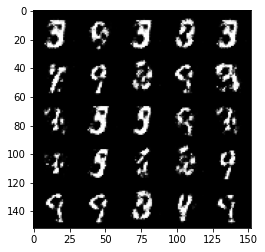

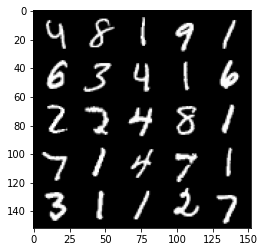

Step 82500: Generator loss: 1.9108766665458687, discriminator loss: 0.3111539574563502


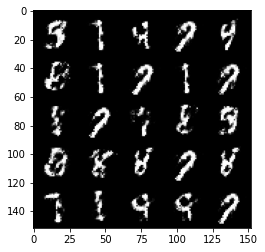

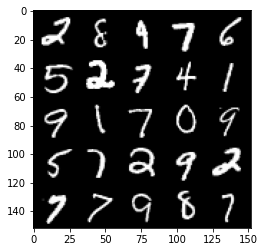

Step 83000: Generator loss: 1.724103847265244, discriminator loss: 0.3491099877357483


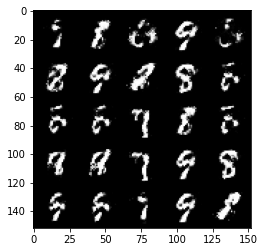

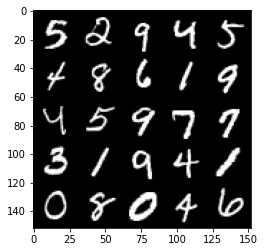

Step 83500: Generator loss: 1.8151861732006074, discriminator loss: 0.32612882125377685


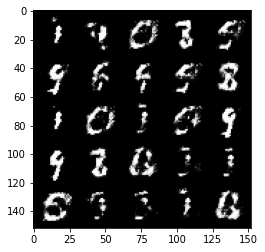

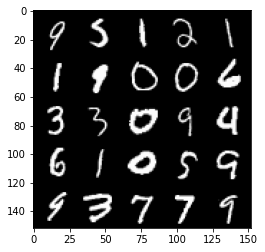

Step 84000: Generator loss: 1.8531066024303422, discriminator loss: 0.29772079548239744


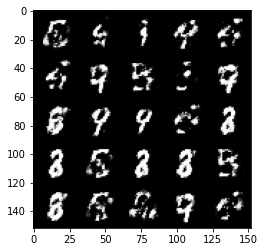

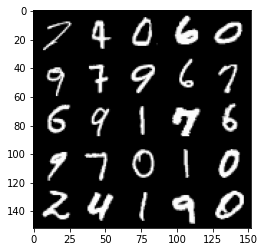

Step 84500: Generator loss: 1.689359194040298, discriminator loss: 0.37283108797669356


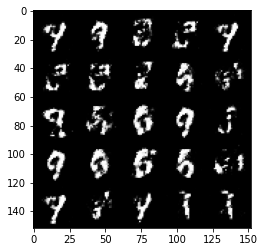

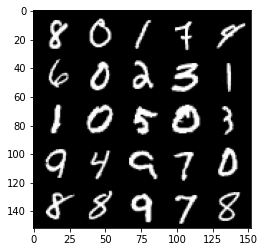

Step 85000: Generator loss: 1.7320737955570218, discriminator loss: 0.3320173555314542


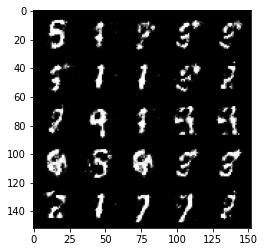

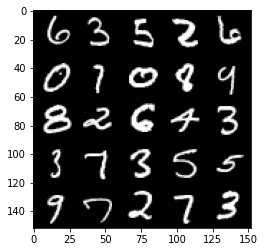

Step 85500: Generator loss: 1.718575834035872, discriminator loss: 0.3609808122217655


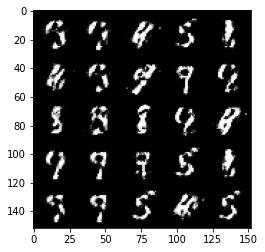

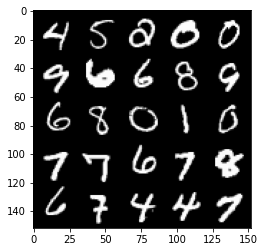

Step 86000: Generator loss: 1.7167352635860456, discriminator loss: 0.35894898378849033


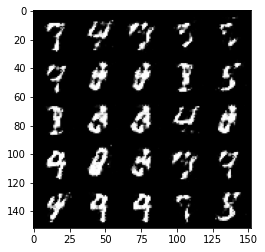

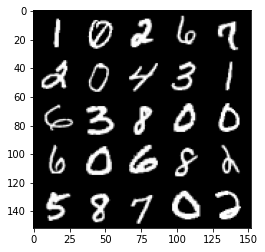

Step 86500: Generator loss: 1.8149262266159047, discriminator loss: 0.3281301853358746


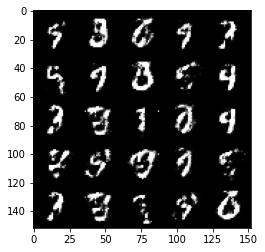

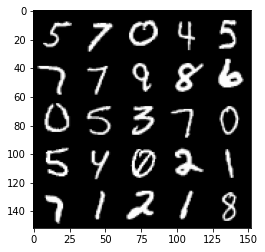

Step 87000: Generator loss: 1.8485255825519569, discriminator loss: 0.3021270014941697


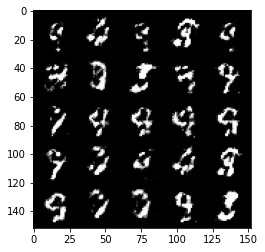

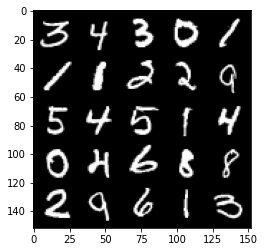

Step 87500: Generator loss: 1.7977902319431283, discriminator loss: 0.3405539013147352


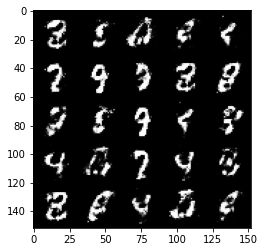

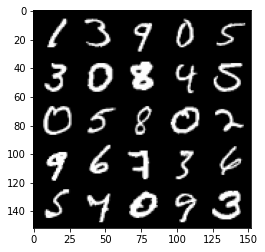

Step 88000: Generator loss: 1.683442740440369, discriminator loss: 0.353868307620287


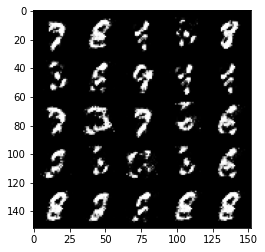

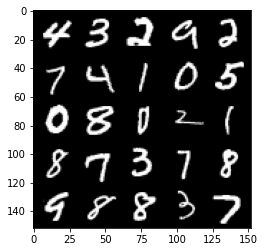

Step 88500: Generator loss: 1.8783765938282024, discriminator loss: 0.2980755357146263


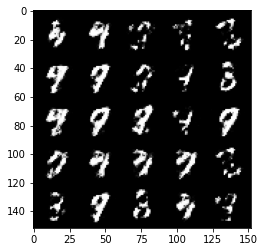

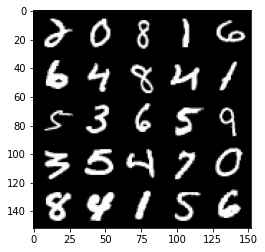

Step 89000: Generator loss: 1.5694362747669233, discriminator loss: 0.4068322378396987


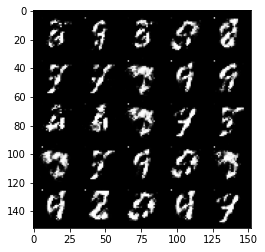

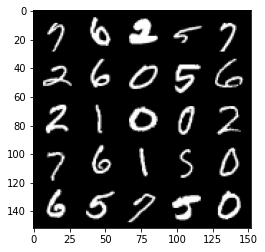

Step 89500: Generator loss: 1.5888904657363894, discriminator loss: 0.3834789208173753


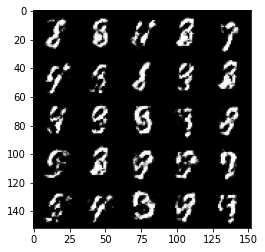

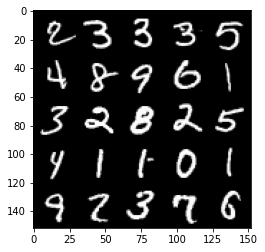

Step 90000: Generator loss: 1.558608022928238, discriminator loss: 0.3907184903621671


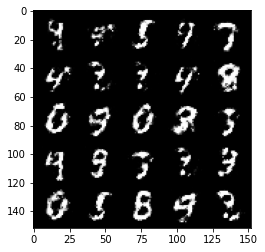

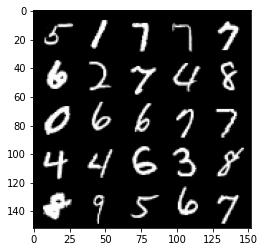

Step 90500: Generator loss: 1.5822779684066781, discriminator loss: 0.37620244705677025


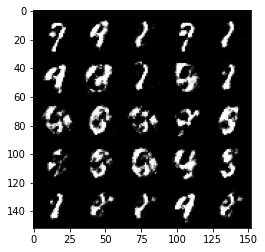

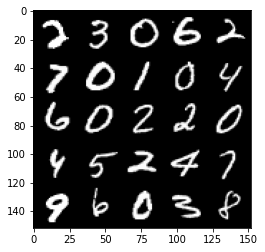

Step 91000: Generator loss: 1.6121711783409125, discriminator loss: 0.38083071213960634


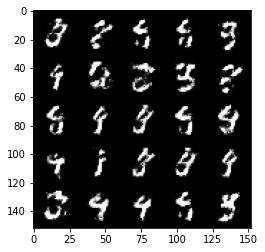

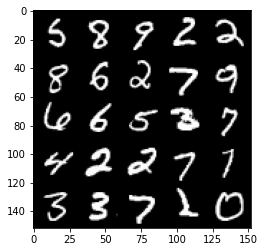

Step 91500: Generator loss: 1.6437165145874018, discriminator loss: 0.3872246243357662


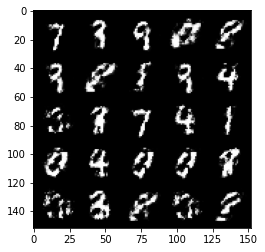

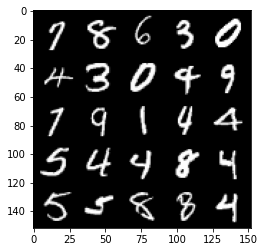

Step 92000: Generator loss: 1.569941499233245, discriminator loss: 0.37762144869565945


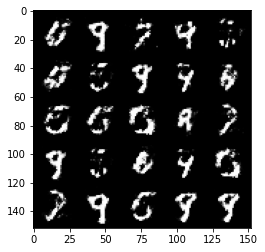

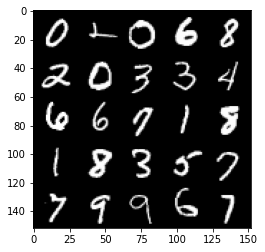

Step 92500: Generator loss: 1.7287507967948919, discriminator loss: 0.33422459477186217


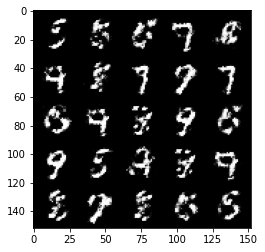

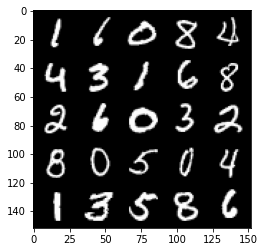

Step 93000: Generator loss: 1.7917285599708572, discriminator loss: 0.33516694393753993


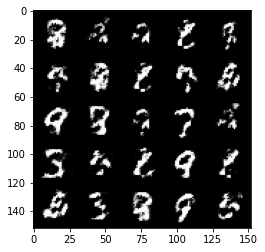

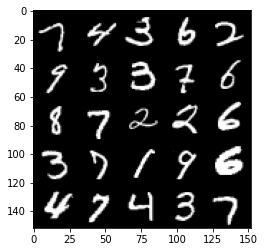

Step 93500: Generator loss: 1.639623582839966, discriminator loss: 0.3808475499153138


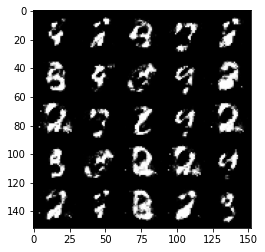

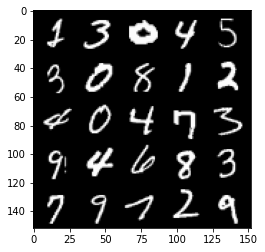

In [37]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(generator_model, discriminator_model, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = generator_model.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(generator_model, discriminator_model, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (generator_model.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(generator_model.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = generator_model(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
